# Classification of paddy rice over Thai Binh in Vietnam

* Exploring time series data for classification

In [1]:
import os
import sys
import itertools
import glob

import numpy as np
import pandas as pd
from osgeo import gdal, gdal_array, osr, ogr

from sklearn.ensemble import RandomForestClassifier
from sklearn import cross_validation
from sklearn.metrics import confusion_matrix

from scipy import ndimage
import scipy

import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits import axes_grid1

import seaborn as sns

/usr3/graduate/zhanli86/anaconda_envs/zhanli_py27/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
sns.set_context("paper")
sns.set_style("whitegrid")
dpi = 300

In [3]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False) # run at the start of every ipython notebook to use plotly.offline
                     # this injects the plotly.js source files into the notebook
import plotly.tools

In [4]:
sys.path.append(os.path.dirname(os.path.abspath(".")))
from sources.ts import geo_ts as gt
from sources.imgcls.classify_image import ImageClassifier

In [5]:
cls_training_roi_asc_file = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_pixel.txt"
cls_training_tiff_file = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_polygon_v1_alos_cut.tif"

cls_img_file_dict = dict( \
alos="/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_alos_hh_hv.tif", \
landsat="/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_cut.tif", \
landsat_alos="/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_hh_hv.tif", \
fusion_ndvi_sg="/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_sg_ndvi_alos_cut.tif")

# cls_rnd_sample_shapefile = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_scenes_rnd_samples.shp"
cls_rnd_sample_shapefile = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_rnd_samples_plus.shp"

## Read classification image

In [6]:
ic = ImageClassifier()

In [7]:
cls_map_profile_dict = {ckey:ic.getRasterProfile(cif) for ckey, cif in cls_img_file_dict.items()}

ncls_dict = {ckey:len(cmprofile['CategoryNames'][0])-1 for ckey, cmprofile in cls_map_profile_dict.items()}

no_data = 0

In [8]:
cls_map_dict = {ckey:ic.readRaster(cif)[0][0] for ckey, cif in cls_img_file_dict.items()}
cls_map_masked_dict = {ckey:np.ma.masked_equal(cm, no_data) for ckey, cm in cls_map_dict.items()}

## Read training data and visualize the distribution

In [9]:
# ic.readTrainingData(cls_training_roi_asc_file)
ic.readTrainingData(cls_training_tiff_file, fmt="GTiff ROI")

In [10]:
px, py = np.unravel_index(ic.traindata['flat_ind'], ic.traindata['dims'], order='C')
label_image = np.zeros(ic.traindata['dims'], dtype=ic.traindata['y'].dtype)
label_image[px, py] = ic.traindata['y']

tmp_flag = label_image != 0
px, py = np.where(tmp_flag)

markers = np.zeros_like(label_image)
markers[tmp_flag] = 1
patch, npat = ndimage.label(markers, structure=np.ones((3, 3)))

In [11]:
patch_label = np.zeros(npat)
patch_npix = np.zeros(npat)
for i in range(npat):
    tmpflag = patch == i+1
    patch_npix[i] = np.sum(tmpflag)
    if len(np.unique(label_image[tmpflag])) > 1:
        print i
    patch_label[i] = np.mean(label_image[tmpflag])

(array([ 1.,  2.,  3.,  4.,  5.,  6.]), array([34,  9, 41, 27,  5,  6]))
(array([1, 2, 3, 4, 5, 6]), array([3894,  450, 2379, 1184,  584,   36]))


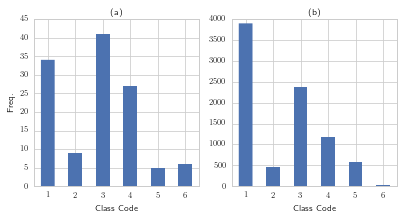

In [12]:
nlabels = len(np.unique(patch_label))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6.5, 3), sharex=True)
ax1.hist(patch_label, bins=np.arange(nlabels+1)+0.5, rwidth=0.5, edgecolor="none")
ax1.set_xlabel("Class Code")
ax1.set_ylabel("Freq.")
ax1.set_title("(a)")
ax1.set_xticks(np.arange(nlabels)+1)
ax2.hist(ic.traindata['y'], bins=np.arange(nlabels+1)+0.5, rwidth=0.5, edgecolor="none")
ax2.set_xlabel("Class Code")
ax2.set_title("(b)")

plt.savefig("../figures/training_data_distribution.png", dpi=dpi, pad_inches=0., \
            bbox_inches='tight')

print np.unique(patch_label, return_counts=True)
print np.unique(ic.traindata['y'], return_counts=True)

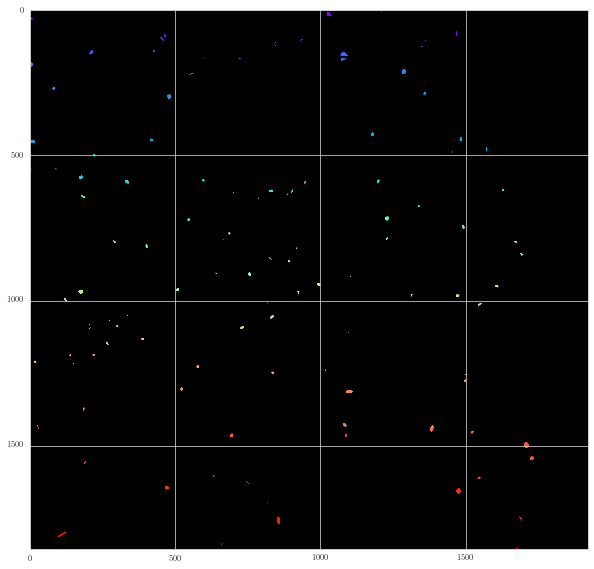

In [13]:
cmap=plt.get_cmap("rainbow", npat)
cmap.set_bad(color="k", alpha=1)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(np.ma.masked_equal(patch, 0), cmap=cmap)

## Read the probability of each class for a map and correct the sample bias

In [14]:
# create the prior probability of each according to the train sample size
tmp = np.unique(ic.traindata['y'], return_counts=True)
cls_prior_prob = tmp[1] / float(np.sum(tmp[1]))
print cls_prior_prob

[ 0.45666706  0.05277354  0.27899613  0.13885306  0.06848833  0.00422188]


In [15]:
no_data = -9999
cls_map_corr_dict = dict()
for ckey, cif in cls_img_file_dict.items():
    tmp = ic.readRaster(cif, band=range(2, 8))[0]
    prob_adj = [1./cls_prior_prob[i]*arr for i, arr in enumerate(tmp)]
    for i, arr in enumerate(tmp):
        prob_adj[i][np.where(arr==no_data)] = no_data
    max_prob = np.max(np.array(prob_adj), axis=0)
    max_ind = np.argmax(np.array(prob_adj), axis=0) + 1
    max_ind[np.where(max_prob==no_data)] = 0
    cls_map_corr_dict[ckey] = max_ind.copy()

## Plot the input images and output classification

In [16]:
figsize = (10, 10)

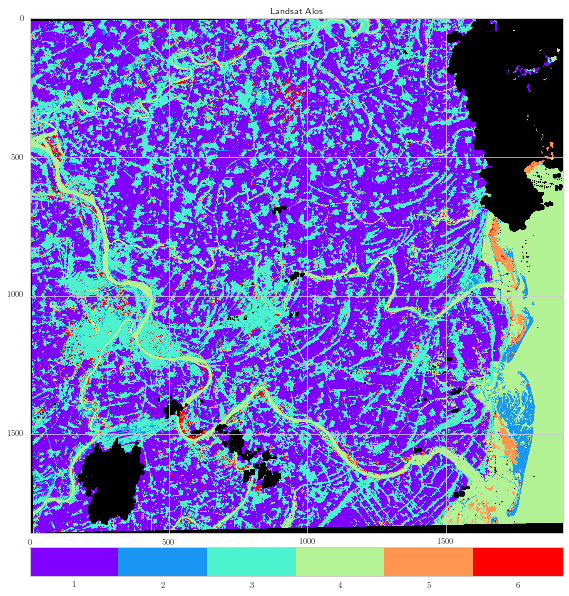

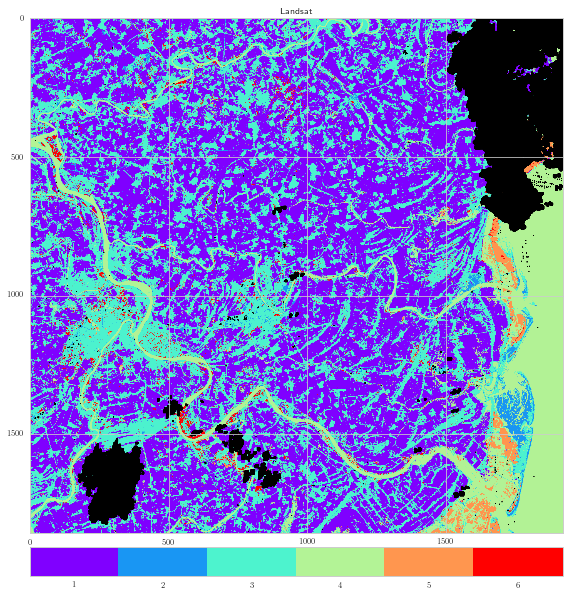

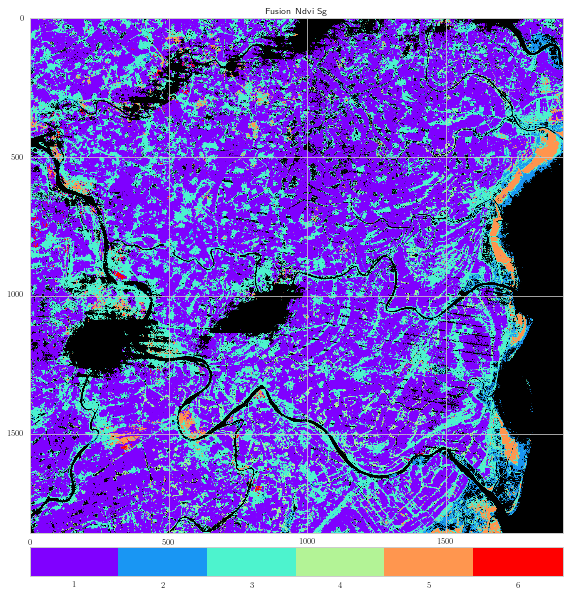

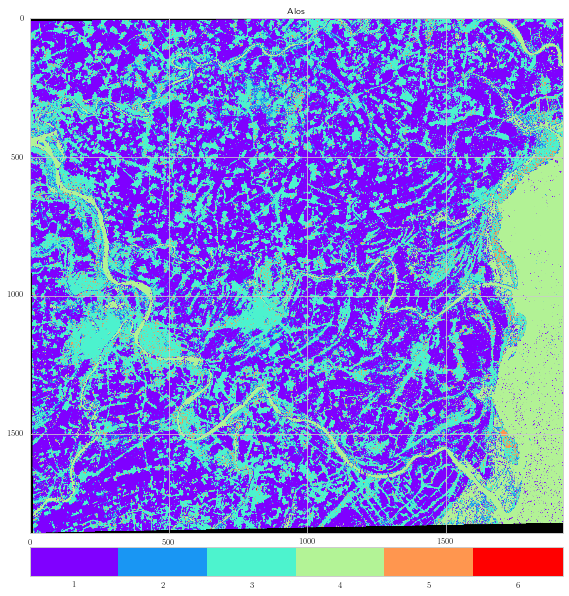

In [17]:
for n, (ckey, cls_map_masked) in enumerate(cls_map_masked_dict.items()):
    fig, ax = plt.subplots(figsize=figsize)
    cm_used = plt.get_cmap("rainbow", ncls_dict[ckey])
    cm_used.set_bad('k', alpha=1)
    imobj = ax.imshow(cls_map_masked, cmap=cm_used)
    plt.setp(ax, title=ckey.replace("_", " ").title())

    divider = axes_grid1.make_axes_locatable(ax)
    cm_ax = divider.append_axes("bottom", 0.4, pad=0.2)
    fig.colorbar(imobj, cax=cm_ax, ax=cm_ax, orientation="horizontal", 
                 ticks=np.arange(ncls_dict[ckey])+1, boundaries=np.arange(ncls_dict[ckey]+1)+0.5, values=np.arange(ncls_dict[ckey])+1)

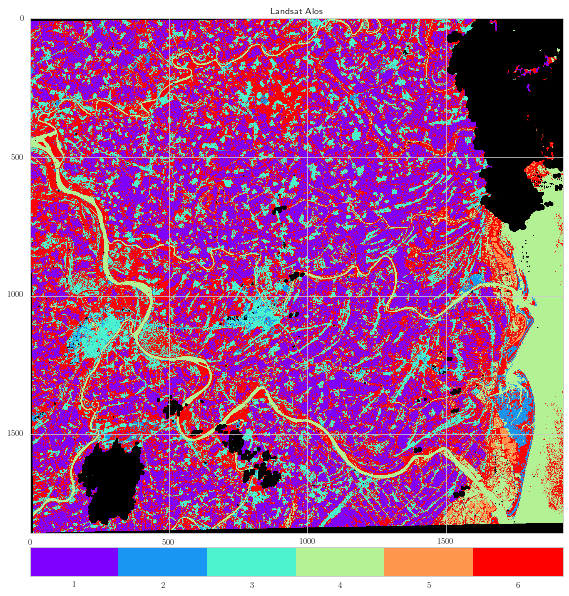

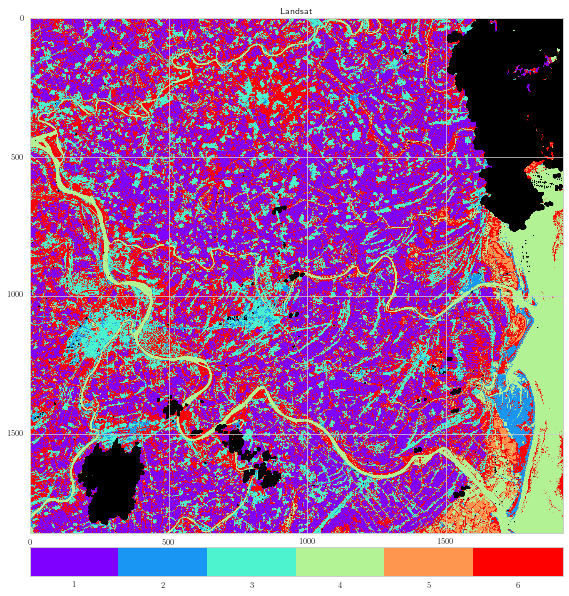

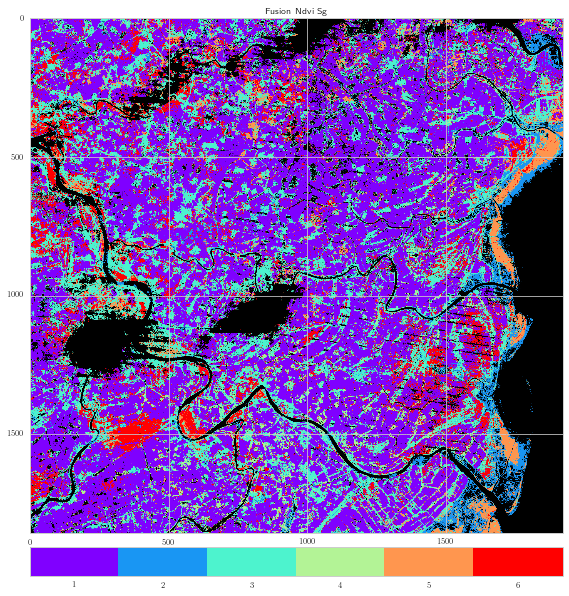

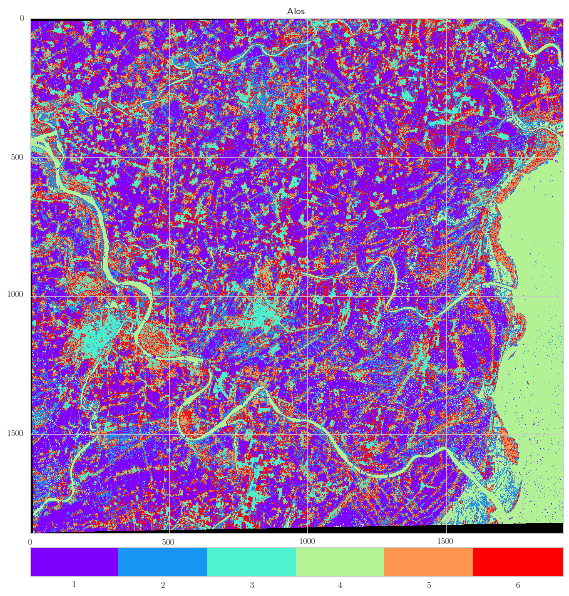

In [18]:
for n, (ckey, cls_map) in enumerate(cls_map_corr_dict.items()):
    cls_map_masked = np.ma.masked_equal(cls_map, 0)
    fig, ax = plt.subplots(figsize=figsize)
    cm_used = plt.get_cmap("rainbow", ncls_dict[ckey])
    cm_used.set_bad('k', alpha=1)
    imobj = ax.imshow(cls_map_masked, cmap=cm_used)
    plt.setp(ax, title=ckey.replace("_", " ").title())

    divider = axes_grid1.make_axes_locatable(ax)
    cm_ax = divider.append_axes("bottom", 0.4, pad=0.2)
    fig.colorbar(imobj, cax=cm_ax, ax=cm_ax, orientation="horizontal", 
                 ticks=np.arange(ncls_dict[ckey])+1, boundaries=np.arange(ncls_dict[ckey]+1)+0.5, values=np.arange(ncls_dict[ckey])+1)

## Inspect the difference between two classification images

In [19]:
cls_map_dict.keys()

['landsat_alos', 'landsat', 'fusion_ndvi_sg', 'alos']

In [20]:
cls_map_pair = {ckey:cls_map_dict[ckey] for ckey in ("landsat_alos", "landsat")}

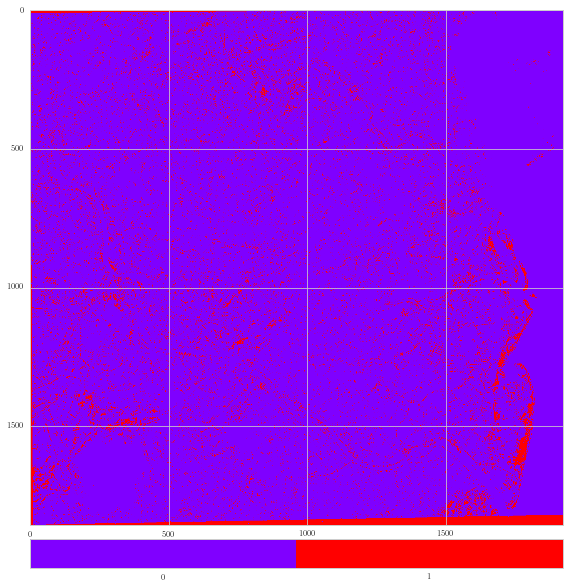

In [21]:
all_valid_flag = np.all(np.stack([clsm!=no_data for ckey, clsm in cls_map_pair.items()], axis=2), axis=2)
cls_diff_map = cls_map_pair.values()[0] != cls_map_pair.values()[1]
cls_diff_map_masked = np.ma.masked_where(np.logical_not(all_valid_flag), cls_diff_map)

fig, ax = plt.subplots(figsize=figsize)
cm_used = plt.get_cmap("rainbow", 2)
cm_used.set_bad('k')
imobj = ax.imshow(cls_diff_map_masked, cmap=cm_used)

divider = axes_grid1.make_axes_locatable(ax)
cm_ax = divider.append_axes("bottom", 0.4, pad=0.2)
fig.colorbar(imobj, cax=cm_ax, orientation="horizontal", 
             ticks=(0, 1), boundaries=(-0.5, 0.5, 1.5), values=(0, 1))

In [22]:
cls_name_list = cls_map_profile_dict[cls_map_pair.keys()[0]]['CategoryNames'][0][1:]
con_mat = confusion_matrix(cls_map_pair.values()[0][all_valid_flag], 
                           cls_map_pair.values()[1][all_valid_flag], 
                           labels=np.arange(ncls_dict.values()[0])+1)
con_mat = pd.DataFrame(con_mat, 
                       index=["{0:s}_{1:s}".format(cn, cls_map_pair.keys()[0]) for cn in cls_name_list], 
                       columns=["{0:s}_{1:s}".format(cn, cls_map_pair.keys()[1]) for cn in cls_name_list])
print con_mat.to_string()

                1_landsat  2_landsat  3_landsat  4_landsat  5_landsat  6_landsat
1_landsat_alos    1568172        192      33119       3004        453       2706
2_landsat_alos       1383      40312      63163        296          0        381
3_landsat_alos      26741      10647     946159       1546         29       8292
4_landsat_alos       4188       1087       9176     378820      10005        381
5_landsat_alos        311          0         24        923      22015        461
6_landsat_alos       4831          8      19811       1146        364      41983


## Write difference to raster file 

In [23]:
# cls_diff_file = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/cls_diff.img"

# no_data = -9999
# cls_diff_map[np.logical_not(all_valid_flag)] = no_data
# cls_diff_map = cls_diff_map.astype(np.int32)
# driver = gdal.GetDriverByName("ENVI")
# out_ds = driver.Create(cls_diff_file, \
#                        cls_diff_map.shape[1], cls_diff_map.shape[0], 1, \
#                        gdal_array.NumericTypeCodeToGDALTypeCode(cls_diff_map.dtype.type))
# out_band = out_ds.GetRasterBand(1)
# out_band.WriteArray(cls_diff_map)
# out_band.SetDescription("Classification Different between {0:s} and {1:s}".format(cls_map_pair.keys()[0], cls_map_pair.keys()[0])) # set band name
# out_band.SetNoDataValue(no_data)
# out_band.FlushCache()

# out_ds.SetGeoTransform(cls_map_profile_dict[cls_map_pair.keys()[0]]['GeoTransform'])
# out_ds.SetProjection(cls_map_profile_dict[cls_map_pair.keys()[0]]['ProjectionRef'])

# out_ds = None

## Stratified random sampling for accuracy assessment

In [24]:
# select_key = cls_map_dict.keys()[0]

# cls_nsamples_dict = dict()
# for select_key in cls_map_dict.keys():
#     cls_map = cls_map_dict[select_key]
#     cls_map_profile = cls_map_profile_dict[select_key]
#     cls_code = np.unique(cls_map).astype(np.uint16)[1:]
#     cls_name = cls_map_profile['CategoryNames'][0][1:]
#     cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])
#     total_npix = np.sum(cls_npix)
#     cls_w = cls_npix / float(total_npix)
#     print cls_code
#     print cls_name
#     print cls_npix
#     print cls_w

#     # expected user's accuracy for the classes
#     cls_u_hat = np.array([0.90, 0.70, 0.85, 0.95, 0.95, 0.50])
#     # standard error of the estimated overall accuracy
#     se_overall = 0.01
#     # standard error of the estimated user's accuracy for each class
#     cls_se = np.array([0.01, 0.05, 0.05, 0.02, 0.05, 0.10])
#     # expected sample size for each class to achieve the standard error given the expected user's accuracy
#     cls_nsamples_hat = np.round(cls_u_hat * (1-cls_u_hat) / cls_se**2 + 1).astype(int)
#     print "Expected sample size", cls_nsamples_hat
#     print "Sum of expected sample size", np.sum(cls_nsamples_hat)

#     # total sample size
#     total_nsamples = int(np.sum(np.sqrt(cls_u_hat*(1.0-cls_u_hat))*cls_w / se_overall)**2)
#     print "Expected total sample size", total_nsamples

#     # proportional sample size for each class
#     cls_nsamples = np.round(total_nsamples * cls_w).astype(int)
#     print "Proportional sample allocation", cls_nsamples

#     nsamples_alc1 = 50
#     cls_nsamples = np.round((total_nsamples - len(cls_code)*nsamples_alc1) * cls_w + nsamples_alc1).astype(int)
#     print "Balanced sample allocation", cls_nsamples

#     # now the expected SE given the number of samples for each class and the expected user's accuracy
#     cls_se_hat = np.sqrt(cls_u_hat * (1-cls_u_hat) / (cls_nsamples - 1))
#     print "Expected SE of user's accuracy for balanced allocation", cls_se_hat
    
#     cls_nsamples_dict[select_key] = cls_nsamples

## Generate stratified random samples for accuracy assessment

In [25]:
# cls_rnd_rows = [None for n in range(len(cls_code))]
# cls_rnd_cols = [None for n in range(len(cls_code))]
# for n in range(len(cls_code)):
#     tmpr, tmpc = np.where(cls_map==cls_code[n])
#     if cls_nsamples[n] < len(tmpr):
#         tmpidx = np.random.choice(len(tmpr), cls_nsamples[n], replace=False)
#     else:
#         tmpidx = np.arange(len(tmpr))
#     cls_rnd_rows[n] = tmpr[tmpidx]
#     cls_rnd_cols[n] = tmpc[tmpidx]
# cls_rnd_rows = np.concatenate(cls_rnd_rows)
# cls_rnd_cols = np.concatenate(cls_rnd_cols)

## Write the random samples to a shapefile of points

In [26]:
def pixel2Proj(geoMatrix, sample, line):
    """
    Covnert pixel location (sample, line), 
    with 0 being the first pixel, to the 
    geospatial coordinates in the projection system, 
    with (x, y) being the UL corner of the pixel.
    """
    ulX = geoMatrix[0]
    ulY = geoMatrix[3]
    xDist = geoMatrix[1]
    yDist = geoMatrix[5]
    rtnX = geoMatrix[2]
    rtnY = geoMatrix[4]
    x = sample * xDist + ulX
    y = line * yDist + ulY
    return (x, y)

def proj2Geo(filename, x, y):
    """
    Convert projected coordinates to geographic coordinates
    given the input raster file    
    """
    ds = gdal.Open(filename, gdal.GA_ReadOnly)
    in_sr = osr.SpatialReference()
    in_sr.ImportFromWkt(ds.GetProjectionRef())
    out_sr = in_sr.CloneGeogCS()
    coord_trans = osr.CoordinateTransformation(in_sr, out_sr)
    return coord_trans.TransformPoint(x, y)[0:2]

In [27]:
# cls_rnd_x, cls_rnd_y = zip(*[pixel2Proj(cls_map_profile['GeoTransform'], s+0.5, l+0.5) for s, l in zip(cls_rnd_cols, cls_rnd_rows)])
# cls_rnd_lon, cls_rnd_lat = zip(*[proj2Geo(cls_img_file_list[0], x, y) for x, y in itertools.izip(cls_rnd_x, cls_rnd_y)])

In [28]:
# # set up the shapefile driver
# driver = ogr.GetDriverByName("ESRI Shapefile")

# # create the data source
# data_source = driver.CreateDataSource(cls_rnd_sample_shapefile)

# # create the spatial reference, WGS84
# srs = osr.SpatialReference()
# srs.ImportFromWkt(cls_map_profile['ProjectionRef'])

# layer = data_source.CreateLayer("cls_rnd_samples", srs, ogr.wkbPoint)
# # Length of field name cannot be more than 10 characters for ESRI shapefile
# field = ogr.FieldDefn("Name", ogr.OFTString)
# field.SetWidth(16)
# layer.CreateField(field)
# layer.CreateField(ogr.FieldDefn("Latitude", ogr.OFTReal))
# layer.CreateField(ogr.FieldDefn("Longitude", ogr.OFTReal))
# layer.CreateField(ogr.FieldDefn("Sample", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("Line", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("PriRefCode", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("SecRefCode", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("MixFlag", ogr.OFTInteger))

# # Process the text file and add the attributes and features to the shapefile
# for n in range(len(cls_rnd_rows)):
#     # create the feature
#     feature = ogr.Feature(layer.GetLayerDefn())
#     # Set the attributes
#     feature.SetField("Name", "{0:d}".format(n+1))
#     feature.SetField("Latitude", cls_rnd_lat[n])
#     feature.SetField("Longitude", cls_rnd_lon[n])
#     feature.SetField("Sample", cls_rnd_cols[n])
#     feature.SetField("Line", cls_rnd_rows[n])
    
#     # create the WKT for the feature using Python string formatting
#     wkt = "POINT({0:f} {1:f})".format(float(cls_rnd_x[n]), float(cls_rnd_y[n]))

#     # Create the point from the Well Known Txt
#     point = ogr.CreateGeometryFromWkt(wkt)

#     # Set the feature geometry using the point
#     feature.SetGeometry(point)
#     # Create the feature in the layer (shapefile)
#     layer.CreateFeature(feature)
#     # Destroy the feature to free resources
#     feature.Destroy()

# # Destroy the data source to free resources
# data_source.Destroy()

In [29]:
%%bash
# ogr2ogr -f KML "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_scenes_rnd_samples.kml" "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_scenes_rnd_samples.shp"

## Read updated shapefile with reference labels

In [30]:
driver = ogr.GetDriverByName("ESRI Shapefile")
data_src = driver.Open(cls_rnd_sample_shapefile, 0)
layer = data_src.GetLayer()

npts = layer.GetFeatureCount()
layer_def = layer.GetLayerDefn()
nfields = layer_def.GetFieldCount()
# get name of fields
field_names = [layer_def.GetFieldDefn(i).GetName() for i in range(nfields)]
# set up a pandas dataframe to read the feature attributes
cls_ref_df = pd.DataFrame(np.zeros((npts, nfields)), columns=field_names)

for i, feature in enumerate(layer):
#     tmp_dict = pd.Series{fd:feature.GetField(fd) for fd in field_names}
#     cls_ref_df.iloc[i, :] = np.array([0 if item is None else np.float(item) for item in tmp_list])
    cls_ref_df.iloc[i, :] = pd.Series({fd:feature.GetField(fd) for fd in field_names})
    
data_src.Destroy()
cls_ref_df.index = cls_ref_df["Name"]

In [31]:
cls_ref_df.tail()

,Name,Latitude,Longitude,Sample,Line,PriRefCode,SecRefCode,MixFlag,RefConf,OtherCrop
Name,,,,,,,,,,
A665,A665,20.322915,106.461640,1261,1528,4,6,1,0,0
A666,A666,20.693144,106.175989,257,170,3,0,0,0,0
A667,A667,20.382075,106.241737,494,1316,2,0,0,2,0
A668,A668,20.527434,106.566278,1618,770,1,0,0,0,0
A669,A669,20.458684,106.136807,127,1036,6,0,0,0,0


In [32]:
# Fill the secondary reference labels
tmp_flag = cls_ref_df['SecRefCode'] == 0
cls_ref_df.loc[tmp_flag, 'SecRefCode'] = cls_ref_df.loc[tmp_flag, 'PriRefCode']
tmp_flag = cls_ref_df["RefConf"] == 0
cls_ref_df.loc[tmp_flag, 'RefConf'] = 3

In [33]:
cls_ref_df.tail()

,Name,Latitude,Longitude,Sample,Line,PriRefCode,SecRefCode,MixFlag,RefConf,OtherCrop
Name,,,,,,,,,,
A665,A665,20.322915,106.461640,1261,1528,4,6,1,3,0
A666,A666,20.693144,106.175989,257,170,3,3,0,3,0
A667,A667,20.382075,106.241737,494,1316,2,2,0,2,0
A668,A668,20.527434,106.566278,1618,770,1,1,0,3,0
A669,A669,20.458684,106.136807,127,1036,6,6,0,3,0


## Calculate the pixel location of reference points in our classification map

In [34]:
cls_ref_df_dict = dict()
for ckey, cif in cls_img_file_dict.items():
    tmp_df = cls_ref_df.copy()
    for idx in tmp_df.index:
        tmp_df.loc[idx, "Sample"], tmp_df.loc[idx, "Line"] = gt.geo2Pixel(cif, tmp_df.loc[idx, "Longitude"], tmp_df.loc[idx, "Latitude"])
    cls_ref_df_dict[ckey] = tmp_df
    
cls_corr_ref_df_dict = dict()
for ckey, cif in cls_img_file_dict.items():
    tmp_df = cls_ref_df.copy()
    for idx in tmp_df.index:
        tmp_df.loc[idx, "Sample"], tmp_df.loc[idx, "Line"] = gt.geo2Pixel(cif, tmp_df.loc[idx, "Longitude"], tmp_df.loc[idx, "Latitude"])
    cls_corr_ref_df_dict[ckey] = tmp_df

## Add class labels to the dataframe of reference points

In [35]:
for ckey, cls_map in cls_map_dict.items():
    # Get the classification labels
    cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict[ckey]["RasterYSize"], 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict[ckey]["RasterXSize"]
                ]
    valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    cls_ref_df_dict[ckey]['ClsCode'] = np.zeros_like(cls_ref_df_dict[ckey]["PriRefCode"])
    cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'] = cls_map[cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Line'].astype(int), 
                                                                  cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Sample'].astype(int)]
    
for ckey, cls_map in cls_map_corr_dict.items():
    # Get the classification labels
    cond_list = [cls_corr_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_corr_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict[ckey]["RasterYSize"], 
                 cls_corr_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_corr_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict[ckey]["RasterXSize"]
                ]
    valid_ref_idx = cls_corr_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    cls_corr_ref_df_dict[ckey]['ClsCode'] = np.zeros_like(cls_corr_ref_df_dict[ckey]["PriRefCode"])
    cls_corr_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'] = cls_map[cls_corr_ref_df_dict[ckey].loc[valid_ref_idx, 'Line'].astype(int), 
                                                                       cls_corr_ref_df_dict[ckey].loc[valid_ref_idx, 'Sample'].astype(int)]    

## Create random samples

In [36]:
# # Need to change here, exclude training pixels from the sampling
# cls_rnd_rows = [None for n in range(len(cls_code))]
# cls_rnd_cols = [None for n in range(len(cls_code))]
# for n in range(len(cls_code)):
#     tmpr, tmpc = np.where(cls_map==cls_code[n])
#     if cls_nsamples[n] < len(tmpr):
#         tmpidx = np.random.choice(len(tmpr), cls_nsamples[n], replace=False)
#     else:
#         tmpidx = np.arange(len(tmpr))
#     cls_rnd_rows[n] = tmpr[tmpidx]
#     cls_rnd_cols[n] = tmpc[tmpidx]
# cls_rnd_rows = np.concatenate(cls_rnd_rows)
# cls_rnd_cols = np.concatenate(cls_rnd_cols)

## Add more points than the current random samples from the shp file

In [37]:
# # for each classification map, more points than the current random samples from the shp file are needed

# # now the cadidate pixels are those, 
# # (1) have all valid class labels across all the classifications, 
# # (2) not in our training samples, 
# # (3) not in current samples.

# cls_map = cls_map_dict.values()[0]
# use_flat_ind = np.ravel_multi_index(np.where(cls_map>-9999), cls_map.shape)
# cond_list = [cmap.flat[use_flat_ind]!=0 for ckey, cmap in cls_map_dict.items()]
# cond_list.append(np.in1d(use_flat_ind, ic.traindata['flat_ind'], invert=True))
# valid_flat_ind = use_flat_ind[np.where(reduce(np.logical_and, cond_list))]
# print valid_flat_ind.shape

# cls_nsamples2add_dict = dict()
# valid_flat_ind_flag = []
# for ckey in cls_map_dict.keys():
#     cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
#                  cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict[ckey]["RasterYSize"], 
#                  cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
#                  cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict[ckey]["RasterXSize"], 
#                  cls_ref_df_dict[ckey]['ClsCode']!=0 
#                 ]
#     valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    
#     # flat index of these potential validation pixels
#     flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
#                                        cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), 
#                                       cls_map.shape)
#     tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
#     valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]
#     tmp_clscode, tmp_nsamples = np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, "ClsCode"], return_counts=True)
#     # how many more points we need for this classification map? 
#     print ckey, tmp_nsamples, cls_nsamples_dict[ckey]
#     cls_nsamples2add_dict[ckey] = cls_nsamples_dict[ckey] - tmp_nsamples
    
# #     valid_flat_ind_flag.append(np.in1d(valid_flat_ind, flat_index, invert=True))
    
# tmp_df = pd.DataFrame(cls_nsamples2add_dict)
# cls_ns2add = tmp_df.max(axis=1)

# # tmp_flag = reduce(np.logical_and, valid_flat_ind_flag)
# # valid_flat_ind = valid_flat_ind[np.where(tmp_flag)]

In [38]:
# cls_rnd_flat_ind = [[] for n in range(len(cls_code))]
# for n in range(len(cls_code)):
#     for ckey, cls_map in cls_map_dict.items():
#         if len(cls_rnd_flat_ind[n]) > 0:
#             cum_flat_ind = np.concatenate(cls_rnd_flat_ind[n])
#             n_extra = cls_nsamples2add_dict[ckey][n] - np.sum(cls_map.flat[cum_flat_ind]==cls_code[n])
#             n_extra = n_extra if n_extra>0 else 0
#             cond_list = [cls_map.flat[valid_flat_ind]==cls_code[n], 
#                          np.in1d(valid_flat_ind, cum_flat_ind, invert=True)]
#         else:
#             n_extra = cls_nsamples2add_dict[ckey][n]
#             cond_list = [cls_map.flat[valid_flat_ind]==cls_code[n]]

#         if n_extra == 0:
#             continue

#         tmp_flat_ind = valid_flat_ind[np.where(reduce(np.logical_and, cond_list))]
#         if n_extra < len(tmp_flat_ind):
#             tmpidx = np.random.choice(len(tmp_flat_ind), n_extra, replace=False)
#         else:
#             tmpidx = np.arange(len(tmp_flat_ind))
#         cls_rnd_flat_ind[n].append(tmp_flat_ind[tmpidx])
#     cls_rnd_flat_ind[n] = np.concatenate(cls_rnd_flat_ind[n])
# cls_rnd_flat_ind = np.concatenate(cls_rnd_flat_ind)

# cls_map_profile = cls_map_profile_dict.values()[0]
# cls_img_file = cls_img_file_dict.values()[0]

# cls_rnd_rows, cls_rnd_cols = np.unravel_index(cls_rnd_flat_ind, cls_map.shape)
# cls_rnd_x, cls_rnd_y = zip(*[gt.pixel2Proj(cls_map_profile['GeoTransform'], s+0.5, l+0.5) for s, l in zip(cls_rnd_cols, cls_rnd_rows)])
# cls_rnd_lon, cls_rnd_lat = zip(*[gt.proj2Geo(cls_img_file, x, y) for x, y in itertools.izip(cls_rnd_x, cls_rnd_y)])

# raster_res = 30.0
# # set up the shapefile driver
# driver = ogr.GetDriverByName("ESRI Shapefile")

# data_src = driver.Open(cls_rnd_sample_shapefile, 0)
# layer = data_src.GetLayer()
# srs = layer.GetSpatialRef()
# # # create the spatial reference, WGS84
# # srs = osr.SpatialReference()
# # srs.ImportFromWkt(cls_map_profile['ProjectionRef'])

# # create the data source
# new_shpfile = os.path.join(os.path.dirname(cls_rnd_sample_shapefile), "vietnam_thai_bin_cls_rf_rnd_samples_plus_polygon.shp")
# if os.path.isfile(new_shpfile):
#     os.remove(new_shpfile)
# data_source = driver.CreateDataSource(new_shpfile)

# # layer = data_source.CreateLayer("cls_rnd_samples", srs, ogr.wkbPoint)
# # # Length of field name cannot be more than 10 characters for ESRI shapefile
# # field = ogr.FieldDefn("Name", ogr.OFTString)
# # field.SetWidth(16)
# # layer.CreateField(field)
# # layer.CreateField(ogr.FieldDefn("Latitude", ogr.OFTReal))
# # layer.CreateField(ogr.FieldDefn("Longitude", ogr.OFTReal))
# # layer.CreateField(ogr.FieldDefn("Sample", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("Line", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("PriRefCode", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("SecRefCode", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("MixFlag", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("RefConf", ogr.OFTInteger))
# # layer.CreateField(ogr.FieldDefn("OtherCrop", ogr.OFTInteger))

# # # Process the text file and add the attributes and features to the shapefile
# # # first add all the existing points
# # for n, idx in enumerate(cls_ref_df.index):
# #     # create the feature
# #     feature = ogr.Feature(layer.GetLayerDefn())
# #     # Set the attributes
# #     feature.SetField("Name", "{0:d}".format(n+1))
# #     feature.SetField("Latitude", cls_ref_df.loc[idx, "Latitude"])
# #     feature.SetField("Longitude", cls_ref_df.loc[idx, "Longitude"])
# #     feature.SetField("Sample", cls_ref_df.loc[idx, "Sample"])
# #     feature.SetField("Line", cls_ref_df.loc[idx, "Line"])
# #     feature.SetField("PriRefCode", cls_ref_df.loc[idx, "PriRefCode"])
# #     feature.SetField("SecRefCode", cls_ref_df.loc[idx, "SecRefCode"])
# #     feature.SetField("MixFlag", cls_ref_df.loc[idx, "MixFlag"])
# #     feature.SetField("RefConf", cls_ref_df.loc[idx, "RefConf"])
# #     feature.SetField("OtherCrop", cls_ref_df.loc[idx, "OtherCrop"])
    
# #     # create the WKT for the feature using Python string formatting
# #     wkt = "POINT({0:f} {1:f})".format(*(gt.geo2Proj(srs, cls_ref_df.loc[idx, "Longitude"], cls_ref_df.loc[idx, "Latitude"])))

# #     # Create the point from the Well Known Txt
# #     point = ogr.CreateGeometryFromWkt(wkt)

# #     # Set the feature geometry using the point
# #     feature.SetGeometry(point)
# #     # Create the feature in the layer (shapefile)
# #     layer.CreateFeature(feature)
# #     # Destroy the feature to free resources
# #     feature.Destroy()

# # # Second add extra points to supplement each classification map
# # ndigit = len(str(len(cls_rnd_rows)))
# # fmtstr = "A{{0:0{0:d}d}}".format(ndigit)
# # for n in range(len(cls_rnd_rows)):
# #     # create the feature
# #     feature = ogr.Feature(layer.GetLayerDefn())
# #     # Set the attributes
# #     feature.SetField("Name", fmtstr.format(n+1))
# #     feature.SetField("Latitude", cls_rnd_lat[n])
# #     feature.SetField("Longitude", cls_rnd_lon[n])
# #     feature.SetField("Sample", cls_rnd_cols[n])
# #     feature.SetField("Line", cls_rnd_rows[n])
    
# #     # create the WKT for the feature using Python string formatting
# #     wkt = "POINT({0:f} {1:f})".format(float(cls_rnd_x[n]), float(cls_rnd_y[n]))

# #     # Create the point from the Well Known Txt
# #     point = ogr.CreateGeometryFromWkt(wkt)

# #     # Set the feature geometry using the point
# #     feature.SetGeometry(point)
# #     # Create the feature in the layer (shapefile)
# #     layer.CreateFeature(feature)
# #     # Destroy the feature to free resources
# #     feature.Destroy()

# layer = data_source.CreateLayer("cls_rnd_samples", srs, ogr.wkbMultiPolygon)
# # Length of field name cannot be more than 10 characters for ESRI shapefile
# field = ogr.FieldDefn("Name", ogr.OFTString)
# field.SetWidth(16)
# layer.CreateField(field)
# layer.CreateField(ogr.FieldDefn("Latitude", ogr.OFTReal))
# layer.CreateField(ogr.FieldDefn("Longitude", ogr.OFTReal))
# layer.CreateField(ogr.FieldDefn("Sample", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("Line", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("PriRefCode", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("SecRefCode", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("MixFlag", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("RefConf", ogr.OFTInteger))
# layer.CreateField(ogr.FieldDefn("OtherCrop", ogr.OFTInteger))

# # Process the text file and add the attributes and features to the shapefile
# # first add all the existing points
# wkt_fmtstr = "POLYGON(({0[0]:f} {0[1]:f}, {1[0]:f} {1[1]:f}, {2[0]:f} {2[1]:f}, {3[0]:f} {3[1]:f}, {4[0]:f} {4[1]:f}))"
# for n, idx in enumerate(cls_ref_df.index):
#     # create the feature
#     feature = ogr.Feature(layer.GetLayerDefn())
#     # Set the attributes
#     feature.SetField("Name", "{0:d}".format(n+1))
#     feature.SetField("Latitude", cls_ref_df.loc[idx, "Latitude"])
#     feature.SetField("Longitude", cls_ref_df.loc[idx, "Longitude"])
#     feature.SetField("Sample", cls_ref_df.loc[idx, "Sample"])
#     feature.SetField("Line", cls_ref_df.loc[idx, "Line"])
#     feature.SetField("PriRefCode", cls_ref_df.loc[idx, "PriRefCode"])
#     feature.SetField("SecRefCode", cls_ref_df.loc[idx, "SecRefCode"])
#     feature.SetField("MixFlag", cls_ref_df.loc[idx, "MixFlag"])
#     feature.SetField("RefConf", cls_ref_df.loc[idx, "RefConf"])
#     feature.SetField("OtherCrop", cls_ref_df.loc[idx, "OtherCrop"])
    
#     # create the WKT for the feature using Python string formatting
#     # wkt = "POINT({0:f} {1:f})".format(*(gt.geo2Proj(srs, cls_ref_df.loc[idx, "Longitude"], cls_ref_df.loc[idx, "Latitude"])))
#     ctr_proj = gt.geo2Proj(srs, cls_ref_df.loc[idx, "Longitude"], cls_ref_df.loc[idx, "Latitude"])
#     ctr_proj = np.array(ctr_proj)
    
#     wkt = wkt_fmtstr.format(ctr_proj+raster_res*np.array([-0.5, 0.5]), 
#                             ctr_proj+raster_res*np.array([0.5, 0.5]), 
#                             ctr_proj+raster_res*np.array([0.5, -0.5]), 
#                             ctr_proj+raster_res*np.array([-0.5, -0.5]), 
#                             ctr_proj+raster_res*np.array([-0.5, 0.5]))

#     # Create the point from the Well Known Txt
#     polygon = ogr.CreateGeometryFromWkt(wkt)

#     # Set the feature geometry using the point
#     feature.SetGeometry(polygon)
#     # Create the feature in the layer (shapefile)
#     layer.CreateFeature(feature)
#     # Destroy the feature to free resources
#     feature.Destroy()

# # Second add extra points to supplement each classification map
# ndigit = len(str(len(cls_rnd_rows)))
# fmtstr = "A{{0:0{0:d}d}}".format(ndigit)
# for n in range(len(cls_rnd_rows)):
#     # create the feature
#     feature = ogr.Feature(layer.GetLayerDefn())
#     # Set the attributes
#     feature.SetField("Name", fmtstr.format(n+1))
#     feature.SetField("Latitude", cls_rnd_lat[n])
#     feature.SetField("Longitude", cls_rnd_lon[n])
#     feature.SetField("Sample", cls_rnd_cols[n])
#     feature.SetField("Line", cls_rnd_rows[n])
    
#     # create the WKT for the feature using Python string formatting
#     # wkt = "POINT({0:f} {1:f})".format(float(cls_rnd_x[n]), float(cls_rnd_y[n]))
#     ctr_proj = np.array((float(cls_rnd_x[n]), float(cls_rnd_y[n])))
    
#     wkt = wkt_fmtstr.format(ctr_proj+raster_res*np.array([-0.5, 0.5]), 
#                             ctr_proj+raster_res*np.array([0.5, 0.5]), 
#                             ctr_proj+raster_res*np.array([0.5, -0.5]), 
#                             ctr_proj+raster_res*np.array([-0.5, -0.5]), 
#                             ctr_proj+raster_res*np.array([-0.5, 0.5]))

#     # Create the point from the Well Known Txt
#     polygon = ogr.CreateGeometryFromWkt(wkt)
#     # Set the feature geometry using the point
#     feature.SetGeometry(polygon)
#     # Create the feature in the layer (shapefile)
#     layer.CreateFeature(feature)
#     # Destroy the feature to free resources
#     feature.Destroy()
    
    
# # Destroy the data source to free resources
# data_source.Destroy()

In [39]:
%%bash -s "$new_shpfile"
# ogr2ogr -f KML ${1%".shp"}".kml" ${1}

## Accuracy assessment for each classification map

In [40]:
class AccReport():
    def __init__(self, con_mat_samp, cls_npix):
        """
        Parameters: **con_mat_samp**, *2D numpy array, shape [n_classes, n_classes]*
                      Sampling confusion matrix in terms of number of samples from 
                      sampling. Rows are mapped labels and columns are reference
                      labels.
                    **cls_npix**, *1D numpy array, shape [n_class]*
                      The marginal total number of pixels in map classes. 
        """
        self.con_mat_samp = con_mat_samp
        self.n_cls = len(con_mat_samp)
        self.cls_npix = cls_npix
        self.cls_w = cls_npix / float(np.sum(cls_npix))
        
        self.runReport()
        
    def runReport(self):
        """Run the accuracy assessment report. 
        """
        # calcualte population confusion matrix in terms of area proportion
        n_i_dot = np.sum(self.con_mat_samp, axis=1)
        self.con_mat_pop = np.tile((self.cls_w / n_i_dot).reshape((self.n_cls, 1)), (1, self.n_cls)) * self.con_mat_samp
        
        # calcualte user's accuracy
        p_i_dot = np.sum(self.con_mat_pop, axis=1)
        self.U = np.array([self.con_mat_pop[i, i]/p_i_dot[i] for i in range(self.n_cls)])
        # calculate user's accuracy standard error
        self.SU = np.sqrt(self.U * (1. - self.U) / (n_i_dot-1))
        
        # calculate overall accuracy
        self.O = reduce(lambda x, y: x+y, [self.con_mat_pop[i, i] for i in range(self.n_cls)])
        self.SO = np.sqrt(np.sum(self.cls_w**2 * self.U * (1.-self.U) / (n_i_dot-1)))
        
        # calculate producer's accuracy
        p_dot_j = np.sum(self.con_mat_pop, axis=0)
        self.P = np.array([self.con_mat_pop[i, i]/p_dot_j[i] for i in range(self.n_cls)])
        # calculate producer's accuracy standard error
        N_i_dot = self.cls_npix
        N_dot_j = np.tile((N_i_dot / n_i_dot.astype(float)).reshape((self.n_cls, 1)), (1, self.n_cls)) * self.con_mat_samp
        N_dot_j = np.sum(N_dot_j, axis=0)
        term1 = N_i_dot**2 * (1-self.P)**2 * self.U * (1.-self.U) / (n_i_dot - 1)
        
        term2 = N_i_dot**2 / n_i_dot.astype(float)
        term2 = np.tile(term2.reshape((self.n_cls, 1)), (1, self.n_cls)) * self.con_mat_samp
        term2 = term2 * (1 - self.con_mat_samp / np.tile(n_i_dot.reshape((self.n_cls, 1)), (1, self.n_cls)))
        term2 = term2 / np.tile(n_i_dot.reshape((self.n_cls, 1)), (1, self.n_cls))
        for i in range(self.n_cls):
            term2[i, i] = 0
        term2 = np.sum(term2, axis=0) * self.P**2
        self.SP = np.sqrt((term1 + term2) / N_dot_j**2)
        
        # calculate estimated proportion of area for classes adjusted for 
        # classification error based on our reference data
        self.p_dot_k = np.sum(self.con_mat_pop, axis=0)
        # calculate the standard error of the estimated area proportion
        tmp = np.tile(self.cls_w.reshape((self.n_cls, 1)), (1, self.n_cls)) * self.con_mat_pop - self.con_mat_pop**2
        tmp = tmp / (np.tile(n_i_dot.reshape((self.n_cls, 1)), (1, self.n_cls)) - 1)
        tmp = np.sum(tmp, axis=0)
        self.Sp_dot_k = np.sqrt(tmp)
        
        
    def getConMatPop(self):
        """Return the estimated population confusion matrix in terms of area 
        proportion.
        """
        return self.con_mat_pop
    
    def getUserAcc(self):
        return self.U, self.SU
    
    def getProducerAcc(self):
        return self.P, self.SP
    
    def getOverallAcc(self):
        return self.O, self.SO
    
    def getAreaPropErrAdjust(self):
        return self.p_dot_k, self.Sp_dot_k

In [42]:
cls_ar_dict = dict()
for ckey, cls_map in cls_map_dict.items():
    print "====================================="
    print "Accuracy Report for Map {0:s}".format(ckey)
    print ic.traindata
    cls_code = np.unique(cls_map).astype(np.uint16)[1:]
    cls_name = cls_map_profile_dict[ckey]['CategoryNames'][0][1:]
    cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])
    
    # Get the classification labels
    cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict[ckey]["RasterYSize"], 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict[ckey]["RasterXSize"], 
                 cls_ref_df_dict[ckey]["ClsCode"]!=0
                ]
    valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    
    # flat index of these potential validation pixels
    flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
                                       cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), ic.traindata['dims'])
    tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
#     print np.sum(np.logical_not(tmp_flag))
    valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]
    
    # Get the confusion matrix using the primary reference labels
    con_mat = confusion_matrix(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], 
                               cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'])
    
#     print valid_ref_idx.shape
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], return_counts=True)
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'],return_counts=True)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode']==6)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'].astype(int)==6)
    
    # classification accuracy report
    cls_ar = AccReport(con_mat.T, cls_npix)
    cls_ar_dict[ckey] = cls_ar

    np.set_printoptions(precision=2, formatter={'float':lambda x: "{0:.2f}".format(x)})

    print "Estimated population confusion matrix"
    print "Rows are prediction and Columns are truth"
    print cls_ar.getConMatPop()
    print np.sum(cls_ar.getConMatPop())
    print
    print "User's accuracy"
    print cls_ar.getUserAcc()[0], cls_ar.getUserAcc()[1]*1.96
    print
    print "Producer's accuracy"
    print cls_ar.getProducerAcc()[0], cls_ar.getProducerAcc()[1]*1.96
    print
    print "Error-adjusted area proportion estimate"
    print cls_ar.getAreaPropErrAdjust()[0], cls_ar.getAreaPropErrAdjust()[1]*1.96
    print
    print "Overall accuracy"
    print cls_ar.getOverallAcc()[0], cls_ar.getOverallAcc()[1]*1.96
    print
    print "Area proportion from classification map"
    print cls_ar.cls_w
    print cls_name

Accuracy Report for Map landsat_alos
{'label_meta': {'cls_code': array([1, 2, 3, 4, 5, 6], dtype=uint8), 'cls_npts': array([3894,  450, 2379, 1184,  584,   36]), 'cls_name': ['1', '2', '3', '4', '5', '6']}, 'dims': (1856, 1921), 'flat_ind': array([   8886,    8887,    8888, ..., 3565130, 3565131, 3565132]), 'X': None, 'y': array([4, 4, 4, ..., 5, 5, 5]), 'ysrc': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_polygon_v1_alos_cut.tif', 'Xsrc': None}
Estimated population confusion matrix
Rows are prediction and Columns are truth
[[0.46 0.01 0.01 0.02 0.00 0.01]
 [0.01 0.01 0.00 0.01 0.00 0.00]
 [0.05 0.03 0.17 0.03 0.00 0.03]
 [0.00 0.00 0.00 0.11 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.01]]
1.0

User's accuracy
[0.91 0.45 0.56 0.87 0.77 0.41] [0.02 0.10 0.05 0.05 0.11 0.10]

Producer's accuracy
[0.88 0.28 0.94 0.65 0.35 0.15] [0.02 0.07 0.03 0.05 0.11 0.04]

Error-adjusted area proporti

In [43]:
cls_corr_ar_dict = dict()
for ckey, cls_map in cls_map_corr_dict.items():
    print "====================================="
    print "Accuracy Report for Map {0:s}".format(ckey)
    print ic.traindata
    cls_code = np.unique(cls_map).astype(np.uint16)[1:]
    cls_name = cls_map_profile_dict[ckey]['CategoryNames'][0][1:]
    cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])
    
    # Get the classification labels
    cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict[ckey]["RasterYSize"], 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict[ckey]["RasterXSize"], 
                 cls_ref_df_dict[ckey]["ClsCode"]!=0
                ]
    valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    
    # flat index of these potential validation pixels
    flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
                                       cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), ic.traindata['dims'])
    tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
#     print np.sum(np.logical_not(tmp_flag))
    valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]
    
    # Get the confusion matrix using the primary reference labels
    con_mat = confusion_matrix(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], 
                               cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'])
    
#     print valid_ref_idx.shape
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], return_counts=True)
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'],return_counts=True)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode']==6)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'].astype(int)==6)
    
    # classification accuracy report
    cls_ar = AccReport(con_mat.T, cls_npix)
    cls_corr_ar_dict[ckey] = cls_ar

    np.set_printoptions(precision=2, formatter={'float':lambda x: "{0:.2f}".format(x)})

    print "Estimated population confusion matrix"
    print "Rows are prediction and Columns are truth"
    print cls_ar.getConMatPop()
    print np.sum(cls_ar.getConMatPop())
    print
    print "User's accuracy"
    print cls_ar.getUserAcc()[0], cls_ar.getUserAcc()[1]*1.96
    print
    print "Producer's accuracy"
    print cls_ar.getProducerAcc()[0], cls_ar.getProducerAcc()[1]*1.96
    print
    print "Error-adjusted area proportion estimate"
    print cls_ar.getAreaPropErrAdjust()[0], cls_ar.getAreaPropErrAdjust()[1]*1.96
    print
    print "Overall accuracy"
    print cls_ar.getOverallAcc()[0], cls_ar.getOverallAcc()[1]*1.96
    print
    print "Area proportion from classification map"
    print cls_ar.cls_w
    print cls_name

Accuracy Report for Map landsat_alos
{'label_meta': {'cls_code': array([1, 2, 3, 4, 5, 6], dtype=uint8), 'cls_npts': array([3894,  450, 2379, 1184,  584,   36]), 'cls_name': ['1', '2', '3', '4', '5', '6']}, 'dims': (1856, 1921), 'flat_ind': array([   8886,    8887,    8888, ..., 3565130, 3565131, 3565132]), 'X': None, 'y': array([4, 4, 4, ..., 5, 5, 5]), 'ysrc': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_polygon_v1_alos_cut.tif', 'Xsrc': None}
Estimated population confusion matrix
Rows are prediction and Columns are truth
[[0.31 0.00 0.00 0.01 0.00 0.01]
 [0.01 0.01 0.00 0.01 0.00 0.00]
 [0.02 0.01 0.09 0.02 0.00 0.02]
 [0.00 0.00 0.00 0.08 0.00 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.00]
 [0.07 0.01 0.03 0.05 0.05 0.15]]
1.0

User's accuracy
[0.91 0.45 0.56 0.87 0.77 0.41] [0.02 0.10 0.05 0.05 0.11 0.10]

Producer's accuracy
[0.74 0.29 0.70 0.50 0.07 0.84] [0.06 0.10 0.12 0.09 0.03 0.05]

Error-adjusted area proporti

## Merge four classification maps together according to the overall accuracy to fill any gaps

In [40]:
cls_map_key_sorted = ['landsat_alos', 'landsat', 'fusion_ndvi_sg', 'alos']

In [41]:
cls_map_merged = cls_map_dict[cls_map_key_sorted[0]].copy()
cls_map_merged_src = np.zeros_like(cls_map_merged)+1

gap_ind = np.where(cls_map_merged == 0)
print len(gap_ind[0])
for i, ckey in enumerate(cls_map_key_sorted[1:]):
    gap_ind = np.where(cls_map_merged == 0)
    print len(gap_ind[0])
    cls_map_merged[gap_ind] = cls_map_dict[ckey][gap_ind]
    cls_map_merged_src[gap_ind] = i+1+1
gap_ind = np.where(cls_map_merged == 0)
cls_map_merged_src[gap_ind] = 0
print len(gap_ind[0])

363247
363247
302984
53445
480


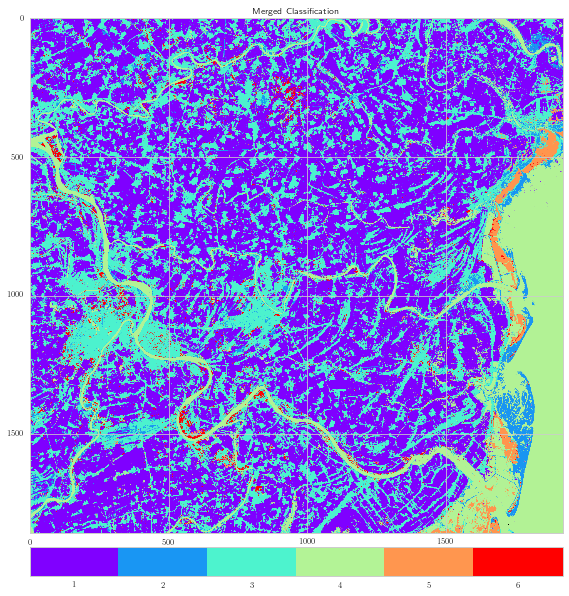

In [42]:
figsize=(10, 10)

ncls_merged = len(np.unique(cls_map_merged))-1
fig, ax = plt.subplots(figsize=figsize)
cm_used = plt.get_cmap("rainbow", ncls_merged)
cm_used.set_bad('k', alpha=1)

cls_map_merged_masked = np.ma.masked_equal(cls_map_merged, 0)
imobj = ax.imshow(cls_map_merged_masked, cmap=cm_used)
plt.setp(ax, title="Merged Classification")

divider = axes_grid1.make_axes_locatable(ax)
cm_ax = divider.append_axes("bottom", 0.4, pad=0.2)
fig.colorbar(imobj, cax=cm_ax, ax=cm_ax, orientation="horizontal", 
             ticks=np.arange(ncls_merged)+1, boundaries=np.arange(ncls_merged+1)+0.5, values=np.arange(ncls_merged)+1)

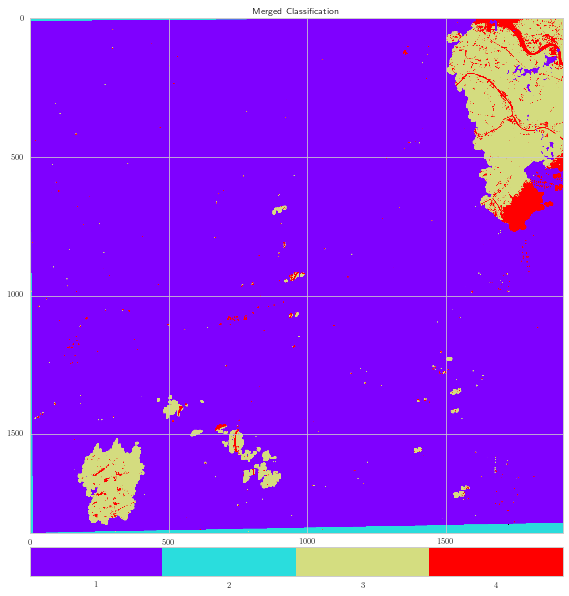

In [43]:
figsize=(10, 10)

ncls_merged = len(np.unique(cls_map_merged_src))-1
fig, ax = plt.subplots(figsize=figsize)
cm_used = plt.get_cmap("rainbow", ncls_merged)
cm_used.set_bad('k', alpha=1)

cls_map_merged_src_masked = np.ma.masked_equal(cls_map_merged_src, 0)
imobj = ax.imshow(cls_map_merged_src_masked, cmap=cm_used)
plt.setp(ax, title="Merged Classification")

divider = axes_grid1.make_axes_locatable(ax)
cm_ax = divider.append_axes("bottom", 0.4, pad=0.2)
fig.colorbar(imobj, cax=cm_ax, ax=cm_ax, orientation="horizontal", 
             ticks=np.arange(ncls_merged)+1, boundaries=np.arange(ncls_merged+1)+0.5, values=np.arange(ncls_merged)+1)

In [44]:
print "============================================="
print "Accuracy Report for Merged Classification Map"
print ic.traindata

cls_map = cls_map_merged
ckey = "merged"

tmp_df = cls_ref_df.copy()
for idx in tmp_df.index:
    tmp_df.loc[idx, "Sample"], tmp_df.loc[idx, "Line"] = gt.geo2Pixel(cls_img_file_dict.values()[0], 
                                                                      tmp_df.loc[idx, "Longitude"], tmp_df.loc[idx, "Latitude"])
cls_ref_df_dict[ckey] = tmp_df
# Get the classification labels
cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
             cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"]
            ]
valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
cls_ref_df_dict[ckey]['ClsCode'] = np.zeros_like(cls_ref_df_dict[ckey]["PriRefCode"])
cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'] = cls_map[cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Line'].astype(int), 
                                                              cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Sample'].astype(int)]


cls_code = np.unique(cls_map).astype(np.uint16)[1:]
cls_name = cls_map_profile_dict.values()[0]['CategoryNames'][0][1:]
cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])

# Get the classification labels
cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
             cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"], 
             cls_ref_df_dict[ckey]["ClsCode"]!=0
            ]
valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]

# flat index of these potential validation pixels
flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
                                   cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), ic.traindata['dims'])
tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
#     print np.sum(np.logical_not(tmp_flag))
valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]

# Get the confusion matrix using the primary reference labels
con_mat = confusion_matrix(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], 
                           cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'])

#     print valid_ref_idx.shape
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], return_counts=True)
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'],return_counts=True)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode']==6)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'].astype(int)==6)

# classification accuracy report
cls_ar = AccReport(con_mat.T, cls_npix)
cls_ar_dict[ckey] = cls_ar

np.set_printoptions(precision=2, formatter={'float':lambda x: "{0:.2f}".format(x)})

print "Estimated population confusion matrix"
print cls_ar.getConMatPop()
print np.sum(cls_ar.getConMatPop())
print
print "User's accuracy"
print cls_ar.getUserAcc()[0], cls_ar.getUserAcc()[1]*1.96
print
print "Producer's accuracy"
print cls_ar.getProducerAcc()[0], cls_ar.getProducerAcc()[1]*1.96
print
print "Error-adjusted area proportion estimate"
print cls_ar.getAreaPropErrAdjust()[0], cls_ar.getAreaPropErrAdjust()[1]*1.96
print
print "Overall accuracy"
print cls_ar.getOverallAcc()[0], cls_ar.getOverallAcc()[1]*1.96
print
print "Area proportion from classification map"
print cls_w
print cls_name

Accuracy Report for Merged Classification Map
{'label_meta': {'cls_code': array([1, 2, 3, 4, 5, 6], dtype=uint8), 'cls_npts': array([3894,  450, 2379, 1184,  584,   36]), 'cls_name': ['1', '2', '3', '4', '5', '6']}, 'dims': (1856, 1921), 'flat_ind': array([   8886,    8887,    8888, ..., 3565130, 3565131, 3565132]), 'X': None, 'y': array([4, 4, 4, ..., 5, 5, 5]), 'ysrc': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_polygon_v1_alos_cut.tif', 'Xsrc': None}
Estimated population confusion matrix
[[0.46 0.01 0.01 0.02 0.00 0.01]
 [0.01 0.02 0.00 0.01 0.00 0.00]
 [0.05 0.03 0.17 0.03 0.00 0.03]
 [0.00 0.00 0.00 0.11 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.01]]
1.0

User's accuracy
[0.91 0.45 0.56 0.86 0.77 0.40] [0.02 0.10 0.05 0.05 0.10 0.10]

Producer's accuracy
[0.88 0.30 0.94 0.65 0.47 0.14] [0.02 0.07 0.03 0.05 0.12 0.04]

Error-adjusted area proportion estimate
[0.52 0.05 0.18 0.17 

In [45]:
cls_map = cls_map_merged.astype(np.uint16)
cls_map_src = cls_map_merged_src.astype(np.uint16)

out_cls_file = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_merged.tif"
driver = gdal.GetDriverByName("GTiff")
out_ds = driver.Create(out_cls_file, \
                       cls_map.shape[1], cls_map.shape[0], 2, \
                       gdal_array.NumericTypeCodeToGDALTypeCode(cls_map.dtype.type))
out_band = out_ds.GetRasterBand(1)
out_band.WriteArray(cls_map)
out_band.SetCategoryNames(["no_data"]+[cn for cn in ic.traindata['label_meta']['cls_name']]) # set the class names
out_band.SetDescription("Classification from Merging") # set band name
out_band.SetNoDataValue(0)
out_band.FlushCache()
out_band = out_ds.GetRasterBand(2)
out_band.WriteArray(cls_map_src)
out_band.SetCategoryNames(["no_data"]+cls_map_key_sorted) # set the class names
out_band.SetDescription("Classification Source for Merging") # set band name
out_band.SetNoDataValue(0)
out_band.FlushCache()

out_ds.SetGeoTransform(cls_map_profile_dict.values()[0]['GeoTransform'])
out_ds.SetProjection(cls_map_profile_dict.values()[0]['ProjectionRef'])

out_ds = None

## Plot the classification accuracy

In [52]:
cls_ar_dict.keys()

['merged within Thai Binh boundary',
 'landsat_alos',
 'landsat',
 'alos',
 'fusion_ndvi_sg',
 'merged']

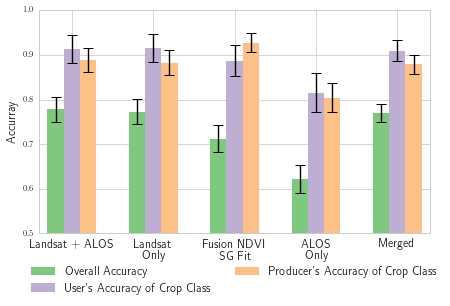

In [71]:
ar_keys = ["landsat_alos", "landsat", "fusion_ndvi_sg", "alos", "merged"]
used_cls_ar_list = [cls_ar_dict[ak] for ak in ar_keys]

figsize = (7, 4)
fontsize = 12
barwidth = 0.2
nbars = 3
bar_shift = barwidth*(np.arange(nbars) - int(nbars*0.5))

x = np.arange(len(ar_keys))+nbars
y, yerr = zip(*[cls_ar.getOverallAcc() for cls_ar in used_cls_ar_list])
yerr = np.array(yerr)*1.96
fig, ax = plt.subplots(figsize=figsize)
ax.bar(x+bar_shift[0], y, width=barwidth, align="center", 
       color="#7fc97f", edgecolor="none",  
       yerr=yerr, capsize=5, ecolor="k", error_kw=dict(capthick=1), 
       label="Overall Accuracy")

y, yerr = zip(*[(cls_ar.getUserAcc()[0][0], cls_ar.getUserAcc()[1][0]) for cls_ar in used_cls_ar_list])
yerr = np.array(yerr)*1.96
ax.bar(x+bar_shift[1], y, width=barwidth, align="center", 
       color="#beaed4", edgecolor="none",  
       yerr=yerr, capsize=5, ecolor="k", error_kw=dict(capthick=1), 
       label="User's Accuracy of Crop Class")

y, yerr = zip(*[(cls_ar.getProducerAcc()[0][0], cls_ar.getProducerAcc()[1][0]) for cls_ar in used_cls_ar_list])
yerr = np.array(yerr)*1.96
ax.bar(x++bar_shift[2], y, width=barwidth, align="center", 
       color="#fdc086", edgecolor="none",  
       yerr=yerr, capsize=5, ecolor="k", error_kw=dict(capthick=1), 
       label="Producer's Accuracy of Crop Class")

# y, yerr = zip(*[(cls_ar.getAreaPropErrAdjust()[0][0], cls_ar.getAreaPropErrAdjust()[1][0]) for cls_ar in used_cls_ar_list])
# yerr = np.array(yerr)*1.96
# twin_ax = ax.twinx()
# twin_ax.bar(x++bar_shift[3], y, width=barwidth, align="center", 
#             color="r", edgecolor="k", 
#             yerr=yerr, capsize=5, ecolor="k", error_kw=dict(capthick=1), 
#             label="Adjusted Area Proportion of Crop Class")

# xticklabels = [k.replace("_", " ") for k in cls_ar_dict.keys()]
xticklabels = ["Landsat + ALOS", "Landsat\nOnly", "Fusion NDVI\nSG Fit", "ALOS\nOnly", "Merged"]
plt.setp(ax, xticks=x,
         ylim=(0.5, 1), 
         xlim=(np.min(x+bar_shift[0])-barwidth, np.max(x+bar_shift[-1])+barwidth))
ax.set_xticklabels(xticklabels, fontsize=fontsize, rotation=0)
ax.set_ylabel("Accurray", fontsize=fontsize)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=2, fontsize=fontsize)
plt.savefig("../figures/classification_comparison_overall_accuracy.png", 
            dpi=dpi, bbox_inches="tight", pad_inches=0.)

In [46]:
# Thai Binh boundary polygon
thai_binh_shp = "/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/VNM_adm_shp/VNM_adm1_thai_binh"

In [47]:
%%bash -s "$thai_binh_shp" "$out_cls_file" "{cls_img_file_dict.values()}"
gdalwarp -overwrite -of "GTiff" -cutline ${1}".shp" -srcnodata 0 -dstnodata 0 ${2} ${2%".tif"}"_thai_binh_cut.tif"
cls_files=${3}
cls_files=${cls_files#"["}
cls_files=${cls_files%"]"}
oIFS="${IFS}"
IFS="," cls_files_arr=(${cls_files})
for clsf in ${cls_files_arr[@]}; do
    clsf=$(echo ${clsf} | tr -d [:space:])
    clsf=${clsf##"'"}
    clsf=${clsf%%"'"}
    gdalwarp -overwrite -of "GTiff" -cutline ${1}".shp" -srcnodata 0 -dstnodata 0 ${clsf} ${clsf%".tif"}"_thai_binh_cut.tif"
done
IFS=oIFS

Creating output file that is 1921P x 1856L.
Processing input file /projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_merged.tif.
0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 1921P x 1856L.
Processing input file /projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_hh_hv.tif.
0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 1921P x 1856L.
Processing input file /projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_cut.tif.
0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 1921P x 1856L.
Processing input file /projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_sg_ndvi_alos_cut.tif.
0...10...20...30...40...50...60...70...80..

In [48]:
# The total area of Thai Binh province from the Thai Binh boundary shapefile polygon
thai_binh_area = 1596766374.97 # in unit of m^2

In [49]:
print "======================================================================="
print "Accuracy Report for Merged Classification Map WITHIN Thai Binh Boundary"
print ic.traindata

cls_map = ic.readRaster(out_cls_file.replace(".tif", "_thai_binh_cut.tif"), [1], out_nodata=0)[0][0]
ckey = "merged within Thai Binh boundary"

tmp_df = cls_ref_df.copy()
for idx in tmp_df.index:
    tmp_df.loc[idx, "Sample"], tmp_df.loc[idx, "Line"] = gt.geo2Pixel(cls_img_file_dict.values()[0], 
                                                                      tmp_df.loc[idx, "Longitude"], tmp_df.loc[idx, "Latitude"])
cls_ref_df_dict[ckey] = tmp_df
# Get the classification labels
cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
             cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"]
            ]
valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
cls_ref_df_dict[ckey]['ClsCode'] = np.zeros_like(cls_ref_df_dict[ckey]["PriRefCode"])
cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'] = cls_map[cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Line'].astype(int), 
                                                              cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Sample'].astype(int)]


cls_code = np.unique(cls_map).astype(np.uint16)[1:]
cls_name = cls_map_profile_dict.values()[0]['CategoryNames'][0][1:]
cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])

# Get the classification labels
cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
             cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
             cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"], 
             cls_ref_df_dict[ckey]["ClsCode"]!=0
            ]
valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]

# flat index of these potential validation pixels
flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
                                   cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), ic.traindata['dims'])
tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
#     print np.sum(np.logical_not(tmp_flag))
valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]
print "Number of samples for assessment = ", len(valid_ref_idx)

# Get the confusion matrix using the primary reference labels
con_mat = confusion_matrix(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], 
                           cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'])

#     print valid_ref_idx.shape
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], return_counts=True)
#     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'],return_counts=True)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode']==6)
#     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'].astype(int)==6)

# classification accuracy report
cls_ar = AccReport(con_mat.T, cls_npix)
cls_ar_dict[ckey] = cls_ar

np.set_printoptions(precision=2, formatter={'float':lambda x: "{0:.2f}".format(x)})

print "Estimated population confusion matrix"
print cls_ar.getConMatPop()
print np.sum(cls_ar.getConMatPop())
print
print "User's accuracy"
print cls_ar.getUserAcc()[0], cls_ar.getUserAcc()[1]*1.96
print
print "Producer's accuracy"
print cls_ar.getProducerAcc()[0], cls_ar.getProducerAcc()[1]*1.96
print
print "Error-adjusted area proportion estimate"
print cls_ar.getAreaPropErrAdjust()[0], cls_ar.getAreaPropErrAdjust()[1]*1.96
print
print "Overall accuracy"
print cls_ar.getOverallAcc()[0], cls_ar.getOverallAcc()[1]*1.96
print
print "Area proportion from classification map"
print cls_w
print cls_name
print
print "Estimated Crop Area"
print thai_binh_area*cls_ar.getAreaPropErrAdjust()[0][0]*1e-4*1e-3 # k ha
print thai_binh_area*cls_ar.getAreaPropErrAdjust()[1][0]*1e-4*1e-3*1.96

Accuracy Report for Merged Classification Map WITHIN Thai Binh Boundary
{'label_meta': {'cls_code': array([1, 2, 3, 4, 5, 6], dtype=uint8), 'cls_npts': array([3894,  450, 2379, 1184,  584,   36]), 'cls_name': ['1', '2', '3', '4', '5', '6']}, 'dims': (1856, 1921), 'flat_ind': array([   8886,    8887,    8888, ..., 3565130, 3565131, 3565132]), 'X': None, 'y': array([4, 4, 4, ..., 5, 5, 5]), 'ysrc': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-field/classification_training_data_polygon_v1_alos_cut.tif', 'Xsrc': None}
Number of samples for assessment =  748
Estimated population confusion matrix
[[0.50 0.00 0.01 0.02 0.00 0.01]
 [0.01 0.01 0.00 0.00 0.00 0.00]
 [0.05 0.03 0.19 0.02 0.00 0.03]
 [0.00 0.00 0.00 0.06 0.00 0.00]
 [0.00 0.00 0.00 0.00 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.01]]
1.0

User's accuracy
[0.91 0.32 0.60 0.85 0.77 0.30] [0.03 0.16 0.06 0.08 0.13 0.12]

Producer's accuracy
[0.89 0.20 0.93 0.52 0.57 0.11] [0.03 0.10 0.04 0.08 0.14 0.

In [50]:
for ckey, clsf in cls_img_file_dict.items():
    print "======================================================================="
    print "Accuracy Report for Classification Map WITHIN Thai Binh Boundary by {0:s}\n".format(ckey)

    cls_map = ic.readRaster(clsf.replace(".tif", "_thai_binh_cut.tif"), [1], out_nodata=0)[0][0]

    tmp_df = cls_ref_df.copy()
    for idx in tmp_df.index:
        tmp_df.loc[idx, "Sample"], tmp_df.loc[idx, "Line"] = gt.geo2Pixel(cls_img_file_dict.values()[0], 
                                                                          tmp_df.loc[idx, "Longitude"], tmp_df.loc[idx, "Latitude"])
    cls_ref_df_dict[ckey] = tmp_df
    # Get the classification labels
    cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"]
                ]
    valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]
    cls_ref_df_dict[ckey]['ClsCode'] = np.zeros_like(cls_ref_df_dict[ckey]["PriRefCode"])
    cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'] = cls_map[cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Line'].astype(int), 
                                                                  cls_ref_df_dict[ckey].loc[valid_ref_idx, 'Sample'].astype(int)]


    cls_code = np.unique(cls_map).astype(np.uint16)[1:]
    cls_name = cls_map_profile_dict.values()[0]['CategoryNames'][0][1:]
    cls_npix = np.array([np.sum(cls_map==cls) for cls in cls_code])

    # Get the classification labels
    cond_list = [cls_ref_df_dict[ckey]['Line'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Line'].astype(int)<cls_map_profile_dict.values()[0]["RasterYSize"], 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)>=0, 
                 cls_ref_df_dict[ckey]['Sample'].astype(int)<cls_map_profile_dict.values()[0]["RasterXSize"], 
                 cls_ref_df_dict[ckey]["ClsCode"]!=0
                ]
    valid_ref_idx = cls_ref_df_dict[ckey].index[np.where(reduce(np.logical_and, cond_list))[0]]

    # flat index of these potential validation pixels
    flat_index = np.ravel_multi_index((cls_ref_df_dict[ckey]['Line'][valid_ref_idx].astype(int), 
                                       cls_ref_df_dict[ckey]['Sample'][valid_ref_idx].astype(int)), ic.traindata['dims'])
    tmp_flag = np.in1d(flat_index, ic.traindata['flat_ind'], invert=True)
    #     print np.sum(np.logical_not(tmp_flag))
    valid_ref_idx = valid_ref_idx[np.where(tmp_flag)]
    print "Number of samples for assessment = ", len(valid_ref_idx)

    # Get the confusion matrix using the primary reference labels
    con_mat = confusion_matrix(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], 
                               cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'])

    #     print valid_ref_idx.shape
    #     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode'], return_counts=True)
    #     print np.unique(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'],return_counts=True)
    #     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'PriRefCode']==6)
    #     print np.sum(cls_ref_df_dict[ckey].loc[valid_ref_idx, 'ClsCode'].astype(int)==6)

    # classification accuracy report
    cls_ar = AccReport(con_mat.T, cls_npix)
    cls_ar_dict[ckey] = cls_ar

    np.set_printoptions(precision=2, formatter={'float':lambda x: "{0:.2f}".format(x)})

    print "Number of pixels in this map"
    print cls_ar.cls_npix
    print "Estimated population confusion matrix"
    print cls_ar.getConMatPop()
    print np.sum(cls_ar.getConMatPop())
    print
    print "User's accuracy"
    print cls_ar.getUserAcc()[0], cls_ar.getUserAcc()[1]*1.96
    print
    print "Producer's accuracy"
    print cls_ar.getProducerAcc()[0], cls_ar.getProducerAcc()[1]*1.96
    print
    print "Error-adjusted area proportion estimate"
    print cls_ar.getAreaPropErrAdjust()[0], cls_ar.getAreaPropErrAdjust()[1]*1.96
    print
    print "Overall accuracy"
    print cls_ar.getOverallAcc()[0], cls_ar.getOverallAcc()[1]*1.96
    print
    print "Area proportion from classification map"
    print cls_w
    print cls_name
    print
    print "Estimated Crop Area"
    print thai_binh_area*cls_ar.getAreaPropErrAdjust()[0][0]*1e-4*1e-3 # k ha
    print thai_binh_area*cls_ar.getAreaPropErrAdjust()[1][0]*1e-4*1e-3*1.96

Accuracy Report for Classification Map WITHIN Thai Binh Boundary by landsat_alos

Number of samples for assessment =  748
Number of pixels in this map
[953418  43904 548858 116740  13967  36554]
Estimated population confusion matrix
[[0.51 0.00 0.01 0.02 0.00 0.01]
 [0.01 0.01 0.00 0.00 0.00 0.00]
 [0.05 0.03 0.19 0.02 0.00 0.03]
 [0.00 0.00 0.00 0.06 0.00 0.00]
 [0.00 0.00 0.00 0.00 0.01 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.01]]
1.0

User's accuracy
[0.91 0.32 0.60 0.85 0.77 0.30] [0.03 0.16 0.06 0.08 0.13 0.12]

Producer's accuracy
[0.89 0.19 0.93 0.53 0.43 0.12] [0.03 0.10 0.04 0.08 0.14 0.06]

Error-adjusted area proportion estimate
[0.57 0.04 0.21 0.11 0.01 0.05] [0.02 0.01 0.02 0.02 0.00 0.02]

Overall accuracy
0.778386400938 0.027941014244

Area proportion from classification map
[0.47 0.08 0.30 0.11 0.04 0.00]
['1', '2', '3', '4', '5', '6']

Estimated Crop Area
91.3714201899
3.77770326388
Accuracy Report for Classification Map WITHIN Thai Binh Boundary by landsat

Number of sampl

In [51]:
cls_img_file_dict

{'alos': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_alos_hh_hv.tif',
 'fusion_ndvi_sg': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_sg_ndvi_alos_cut.tif',
 'landsat': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_cut.tif',
 'landsat_alos': '/projectnb/echidna/lidar/zhanli86/workspace/data/projects/kaiyu-adb-crop/vietnam-cls/vietnam_thai_bin_cls_rf_lsat_alos_hh_hv.tif'}